## Exploratory Data Analysis

*Step1: Import Basic Libraries*

In [153]:
#basic libraries
import numpy as np
import pandas as pd
import sqlite3
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

*Step2: Load Data*

In [154]:
#load Data
conn = sqlite3.connect("data\wildfire_burnedarea_emissions_data.db")

In [155]:
burnedarea_df = pd.read_sql_query("SELECT * FROM wildfire_burnedarea_data",conn)
emissions_df = pd.read_sql_query("SELECT * FROM wildfire_emissions_data",conn)
merged_df= pd.read_sql_query("SELECT * FROM wildfire_merged_data",conn)

*Step3: Data Inspection*


Basic checks on burned area dataset

In [156]:
burnedarea_df.head()

,Year,Month,Quarter,Country_Code,Country_Name,Region_Name,Forest_BA,Savannas_BA,Shrubs_Grasslands_BA,Croplands_BA,Other_BA
0,2002,1,Q1,AGO,Angola,Huíla,0.0,0.000,407.851,0.0,0.000
1,2002,1,Q1,AGO,Angola,Lunda Norte,0.0,64.398,42.932,0.0,0.000
2,2002,1,Q1,AGO,Angola,Malanje,0.0,0.000,21.466,0.0,0.000
3,2002,1,Q1,AGO,Angola,Moxico,0.0,279.056,21.466,0.0,64.398
4,2002,1,Q1,AGO,Angola,Namibe,0.0,0.000,236.125,0.0,0.000


In [157]:
burnedarea_df.shape

(222634, 11)

In [158]:
burnedarea_df.columns

Index(['Year', 'Month', 'Quarter', 'Country_Code', 'Country_Name',
       'Region_Name', 'Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA',
       'Croplands_BA', 'Other_BA'],
      dtype='object')

In [159]:
burnedarea_df.dtypes

Year                      int64
Month                     int64
Quarter                  object
Country_Code             object
Country_Name             object
Region_Name              object
Forest_BA               float64
Savannas_BA             float64
Shrubs_Grasslands_BA    float64
Croplands_BA            float64
Other_BA                float64
dtype: object

In [160]:
burnedarea_df.isnull().sum()

Year                    0
Month                   0
Quarter                 0
Country_Code            0
Country_Name            0
Region_Name             0
Forest_BA               0
Savannas_BA             0
Shrubs_Grasslands_BA    0
Croplands_BA            0
Other_BA                0
dtype: int64

In [161]:
burnedarea_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 222634 entries, 0 to 222633
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Year                  222634 non-null  int64  
 1   Month                 222634 non-null  int64  
 2   Quarter               222634 non-null  object 
 3   Country_Code          222634 non-null  object 
 4   Country_Name          222634 non-null  object 
 5   Region_Name           222634 non-null  object 
 6   Forest_BA             222634 non-null  float64
 7   Savannas_BA           222634 non-null  float64
 8   Shrubs_Grasslands_BA  222634 non-null  float64
 9   Croplands_BA          222634 non-null  float64
 10  Other_BA              222634 non-null  float64
dtypes: float64(5), int64(2), object(4)
memory usage: 18.7+ MB


In [162]:
burnedarea_df.describe()

,Year,Month,Forest_BA,Savannas_BA,Shrubs_Grasslands_BA,Croplands_BA,Other_BA
count,222634.000000,222634.000000,2.226340e+05,2.226340e+05,2.226340e+05,2.226340e+05,222634.000000
mean,2012.349668,6.346780,3.110262e+03,1.496965e+04,1.831501e+04,3.054796e+03,137.528450
std,6.302550,3.436467,2.692472e+04,9.049428e+04,1.461267e+05,2.106869e+04,1726.424996
min,2002.000000,1.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,2007.000000,3.000000,0.000000e+00,0.000000e+00,2.146600e+01,0.000000e+00,0.000000
50%,2012.000000,6.000000,0.000000e+00,2.146600e+01,2.575900e+02,4.293200e+01,0.000000
75%,2018.000000,9.000000,8.586300e+01,7.298390e+02,2.618836e+03,6.654420e+02,21.466000
max,2023.000000,12.000000,1.647377e+06,3.495716e+06,1.935730e+07,1.615006e+06,288801.779000


In [163]:
burnedarea_df.describe(include='object')

,Quarter,Country_Code,Country_Name,Region_Name
count,222634,222634,222634,222634
unique,4,195,195,2803
top,Q1,RUS,Russia,Central
freq,60963,10657,10657,981


In [164]:
burnedarea_df.nunique()

Year                       22
Month                      12
Quarter                     4
Country_Code              195
Country_Name              195
Region_Name              2803
Forest_BA                4693
Savannas_BA             10378
Shrubs_Grasslands_BA    10664
Croplands_BA             4244
Other_BA                  760
dtype: int64

In [165]:
burnedarea_df.duplicated().sum()

0

Basic checks on emissions dataset

In [166]:
emissions_df.head()

,Year,Month,Quarter,Country_Code,Country_Name,Region_Name,CO2,CO,TPM,PM25,TPC,NMHC,OC,CH4,SO2,BC,NOx
0,2002,1,Q1,AFG,Afghanistan,Jawzjan,139.786,5.549,0.738,0.591,0.250,0.333,0.216,0.191,0.039,0.034,0.319
1,2002,1,Q1,AFG,Afghanistan,Kunar,14828.511,554.090,74.758,63.061,26.385,29.903,23.043,17.062,4.222,3.254,34.301
2,2002,1,Q1,AFG,Afghanistan,Takhar,492.090,31.668,3.850,1.944,0.947,3.074,0.714,1.807,0.124,0.233,0.966
3,2002,1,Q1,AGO,Angola,Huíla,16875.859,630.593,85.080,71.767,30.028,34.032,26.225,19.418,4.805,3.703,39.037
4,2002,1,Q1,AGO,Angola,Moxico,20483.095,765.383,103.266,87.108,36.447,41.306,31.830,23.569,5.831,4.495,47.381


In [167]:
emissions_df.shape

(396959, 17)

In [168]:
emissions_df.columns

Index(['Year', 'Month', 'Quarter', 'Country_Code', 'Country_Name',
       'Region_Name', 'CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4',
       'SO2', 'BC', 'NOx'],
      dtype='object')

In [169]:
emissions_df.dtypes

Year              int64
Month             int64
Quarter          object
Country_Code     object
Country_Name     object
Region_Name      object
CO2             float64
CO              float64
TPM             float64
PM25            float64
TPC             float64
NMHC            float64
OC              float64
CH4             float64
SO2             float64
BC              float64
NOx             float64
dtype: object

In [170]:
emissions_df.isnull().sum()

Year            0
Month           0
Quarter         0
Country_Code    0
Country_Name    0
Region_Name     0
CO2             0
CO              0
TPM             0
PM25            0
TPC             0
NMHC            0
OC              0
CH4             0
SO2             0
BC              0
NOx             0
dtype: int64

In [171]:
emissions_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396959 entries, 0 to 396958
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Year          396959 non-null  int64  
 1   Month         396959 non-null  int64  
 2   Quarter       396959 non-null  object 
 3   Country_Code  396959 non-null  object 
 4   Country_Name  396959 non-null  object 
 5   Region_Name   396959 non-null  object 
 6   CO2           396959 non-null  float64
 7   CO            396959 non-null  float64
 8   TPM           396959 non-null  float64
 9   PM25          396959 non-null  float64
 10  TPC           396959 non-null  float64
 11  NMHC          396959 non-null  float64
 12  OC            396959 non-null  float64
 13  CH4           396959 non-null  float64
 14  SO2           396959 non-null  float64
 15  BC            396959 non-null  float64
 16  NOx           396959 non-null  float64
dtypes: float64(11), int64(2), object(4)
memory usage

In [172]:
emissions_df.describe()

,Year,Month,CO2,CO,TPM,PM25,TPC,NMHC,OC,CH4,SO2,BC,NOx
count,396959.000000,396959.000000,3.969590e+05,3.969590e+05,3.969590e+05,3.969590e+05,3.969590e+05,3.969590e+05,3.969590e+05,3.969590e+05,396959.000000,396959.000000,396959.000000
mean,2012.920161,6.421804,3.855810e+05,1.885944e+04,2.512471e+03,1.989838e+03,1.026588e+03,9.890601e+02,9.255114e+02,8.217390e+02,128.729302,99.265846,748.117203
std,6.338737,3.329978,3.218538e+06,2.198252e+05,2.860767e+04,2.368582e+04,1.496080e+04,1.210422e+04,1.411233e+04,1.230756e+04,1621.566192,904.258344,5029.062252
min,2002.000000,1.000000,6.000000e-03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
25%,2007.000000,4.000000,1.240316e+03,5.904500e+01,7.791500e+00,5.345000e+00,2.449000e+00,4.164000e+00,2.033000e+00,2.437000e+00,0.353000,0.379000,2.559000
50%,2013.000000,6.000000,6.643739e+03,3.173630e+02,4.220000e+01,2.920100e+01,1.370700e+01,2.277100e+01,1.152600e+01,1.337200e+01,1.948000,2.039000,13.710000
75%,2018.000000,9.000000,4.776594e+04,2.248423e+03,3.019070e+02,2.145495e+02,1.020825e+02,1.545635e+02,8.712850e+01,9.322800e+01,14.295500,14.170000,98.448000
max,2023.000000,12.000000,4.861004e+08,4.179221e+07,5.709191e+06,4.951828e+06,3.269124e+06,2.701767e+06,3.108618e+06,2.017337e+06,354711.379000,160506.073000,498959.289000


In [173]:
emissions_df.describe(include='object')

,Quarter,Country_Code,Country_Name,Region_Name
count,396959,396959,396959,396959
unique,4,183,183,2807
top,Q2,RUS,Russia,Central
freq,105045,13664,13664,1303


In [174]:
emissions_df.nunique()

Year                22
Month               12
Quarter              4
Country_Code       183
Country_Name       183
Region_Name       2807
CO2             390753
CO              319683
TPM             212720
PM25            195137
TPC             160523
NMHC            181057
OC              153665
CH4             157461
SO2              90424
BC               89504
NOx             159448
dtype: int64

In [175]:
emissions_df.duplicated().sum()

0

Based on the basic checks,the dataset contains of 195 countries, we've chosen to focus on just the top 10 countries with the highest burned areas and emissions. This helps us to concentrate on the countries that have the biggest impact on these factors globally. So, I'm creating a new table called `merged_top10_df` using data from `merged_df` to analyse these top 10 countries more closely.

In [176]:
conn = sqlite3.connect("data\wildfire_burnedarea_emissions_data.db")
# Step 2: Calculate the total burned area and total emissions for each country
merged_df['Total_Burned_Area'] = merged_df[['Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA', 'Croplands_BA', 'Other_BA']].sum(axis=1)
merged_df['Total_Emissions'] = merged_df[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum(axis=1)

# Step 3: Identify the top 10 countries based on total burned area and total emissions
top_countries_by_burned_area = merged_df.groupby('Country_Name')['Total_Burned_Area'].sum().nlargest(10).index
top_countries_by_emissions = merged_df.groupby('Country_Name')['Total_Emissions'].sum().nlargest(10).index

# Combine the top countries from both lists
top_countries = set(top_countries_by_burned_area).union(set(top_countries_by_emissions))

# Step 4: Filter the original dataframe to include only these top countries
filtered_merged_df = merged_df[merged_df['Country_Name'].isin(top_countries)]

# Step 5: Create a new table in the SQLite database and store the filtered data
try:
    cursor = conn.cursor()

    # Create the new table for the filtered data
    cursor.execute('''
        CREATE TABLE IF NOT EXISTS merged_top10_data (
            Year INT,
            Month INT,
            Quarter VARCHAR(10),
            Country_Code VARCHAR(10),
            Country_Name VARCHAR(100),
            Region_Name VARCHAR(100),
            Forest_BA FLOAT,
            Savannas_BA FLOAT,
            Shrubs_Grasslands_BA FLOAT,
            Croplands_BA FLOAT,
            Other_BA FLOAT,
            CO2 FLOAT,
            CO FLOAT,
            TPM FLOAT,
            PM25 FLOAT,
            TPC FLOAT,
            NMHC FLOAT,
            OC FLOAT,
            CH4 FLOAT,
            SO2 FLOAT,
            BC FLOAT,
            NOx FLOAT,
            Total_Burned_Area FLOAT,
            Total_Emissions FLOAT,
            PRIMARY KEY (Year, Month, Country_Code)
        );
    ''')

    # Insert the filtered data into the new table
    filtered_merged_df.to_sql('merged_top10_data', conn, if_exists='replace', index=False)

    # Commit the transaction
    conn.commit()
    print("Filtered data inserted successfully into SQLite table merged_top10_data.")

except Exception as e:
    print(f"Error: {e}")
    conn.rollback()


Filtered data inserted successfully into SQLite table merged_top10_data.


In [26]:
merged10_df= pd.read_sql_query("SELECT * FROM merged_top10_data",conn)

*Step5: WildFire Burned Area DataAnalysis*

**1. Different Burned Areas over Years**

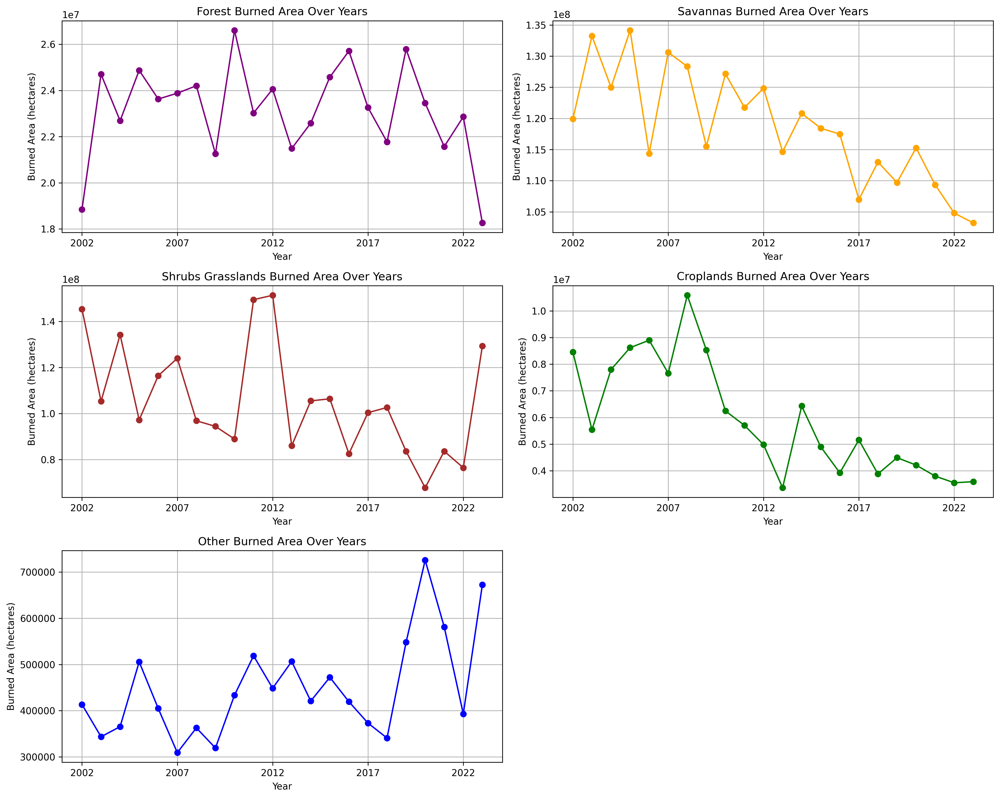

In [204]:
# Define the land types and their corresponding colors
land_types = {
    'Forest_BA': 'purple',
    'Savannas_BA': 'orange',
    'Shrubs_Grasslands_BA': 'brown',
    'Croplands_BA': 'green',
    'Other_BA': 'blue'
}
# Group data by year and calculate the total burned area for each type
burned_areas_yearly = merged10_df.groupby('Year')[list(land_types.keys())].sum()

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 12), dpi=300)
axes = axes.flatten()
for i, (land_type, color) in enumerate(land_types.items()):
    burned_areas_yearly[land_type].plot(ax=axes[i], kind='line', marker='o', color=color)
    axes[i].set_title(f'{land_type.replace("_BA", "").replace("_", " ")} Burned Area Over Years')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Burned Area (hectares)')
    axes[i].grid(True)
# Remove the unused subplot (axes[5]) as it's not needed
fig.delaxes(axes[5])
plt.tight_layout()
plt.show()


#### Insights 

* **Declining Trends:** Both Savannas and Croplands show a significant declining trend in burned areas over the years, which could indicate improved land management and fire prevention measures in these regions.

* **High Variability:** Forests, Shrubs Grasslands, and "Other" categories exhibit high variability in burned areas, suggesting that these land types might be more susceptible to varying environmental conditions and fire management practices.

* **Peaks and Dips:** Several peaks and dips in the burned areas across different land types highlight the episodic nature of wildfires, possibly driven by specific climatic conditions (e.g., droughts, wet years) or human activities (e.g., land clearing, fire suppression). 

**2. Different Burned Areas over Quarter**

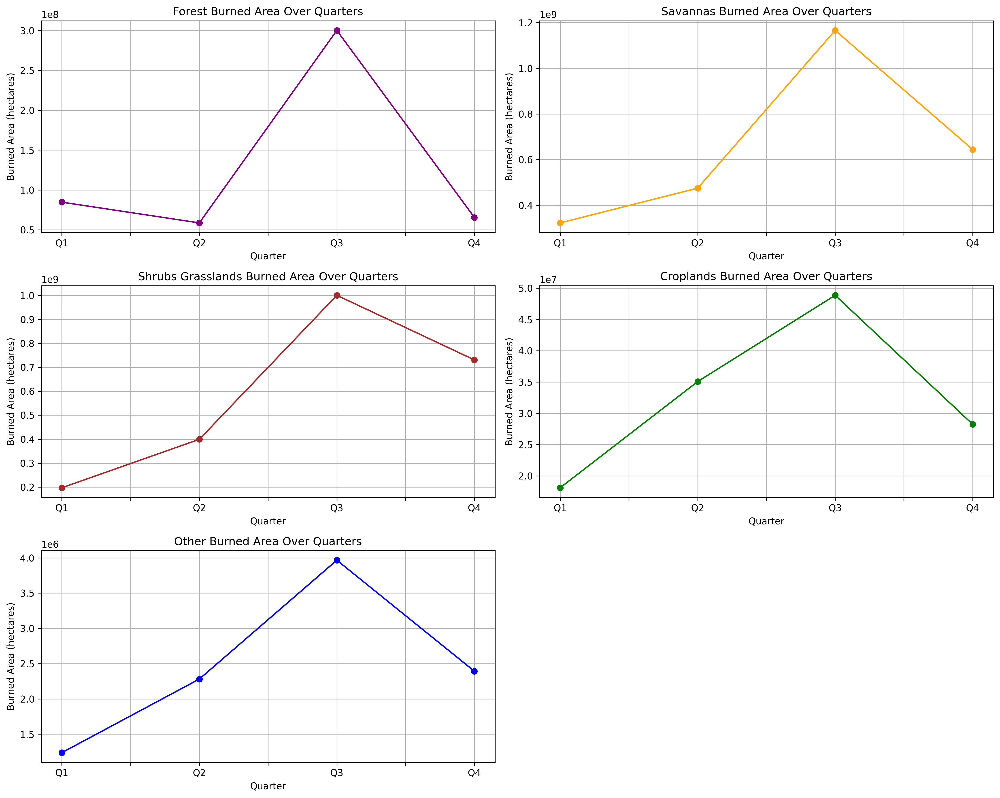

In [178]:
# Define the land types and their corresponding colors
land_types = {
    'Forest_BA': 'purple',
    'Savannas_BA': 'orange',
    'Shrubs_Grasslands_BA': 'brown',
    'Croplands_BA': 'green',
    'Other_BA': 'blue'
}
# Group data by year and calculate the total burned area for each type
burned_areas_quarterly = merged10_df.groupby('Quarter')[list(land_types.keys())].sum()

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 12), dpi=300)
axes = axes.flatten()
for i, (land_type, color) in enumerate(land_types.items()):
    burned_areas_quarterly[land_type].plot(ax=axes[i], kind='line', marker='o', color=color)
    axes[i].set_title(f'{land_type.replace("_BA", "").replace("_", " ")} Burned Area Over Quarters')
    axes[i].set_xlabel('Quarter')
    axes[i].set_ylabel('Burned Area (hectares)')
    axes[i].grid(True)
fig.delaxes(axes[5])
plt.tight_layout()
plt.show()

#### Insights 

* **Peak Fire Season:** For all land cover types, the third quarter (Q3) shows the highest burned areas. This indicates a common peak fire season around the same time of the year, likely due to climatic factors such as higher temperatures and lower precipitation.

* **Seasonal Variability:** The significant drop in burned areas in the fourth quarter (Q4) across all land cover types suggests that fire risk decreases as the year progresses into cooler and possibly wetter seasons.

* **Consistent Patterns:** The consistent pattern of increasing burned areas from Q1 to Q3 and then a decrease in Q4 across different land types highlights the influence of seasonal climatic conditions on fire occurrences.


**3. Different Burned Areas over Months**

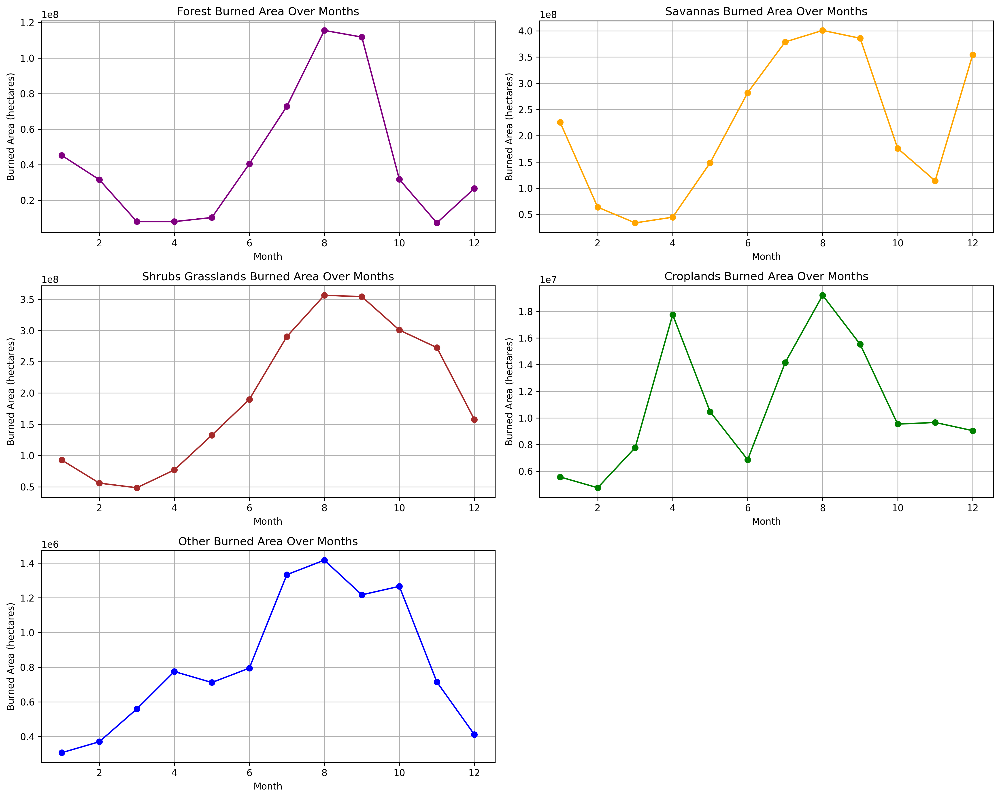

In [181]:
# Define the land types and their corresponding colors
land_types = {
    'Forest_BA': 'purple',
    'Savannas_BA': 'orange',
    'Shrubs_Grasslands_BA': 'brown',
    'Croplands_BA': 'green',
    'Other_BA': 'blue'
}
# Group data by year and calculate the total burned area for each type
burned_areas_monthly = merged10_df.groupby('Month')[list(land_types.keys())].sum()

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 12), dpi=300)
axes = axes.flatten()
for i, (land_type, color) in enumerate(land_types.items()):
    burned_areas_monthly[land_type].plot(ax=axes[i], kind='line', marker='o', color=color)
    axes[i].set_title(f'{land_type.replace("_BA", "").replace("_", " ")} Burned Area Over Months')
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Burned Area (hectares)')
    axes[i].grid(True)
fig.delaxes(axes[5])
plt.tight_layout()
plt.show()

#### Insights 

* **Peak Fire Season:** For all land cover types, August (Month 8) is the month with the highest burned areas, indicating a common peak fire season during the late summer.

* **Seasonal Variability:** The lowest burned areas are generally observed in the winter months (December to February), suggesting that cooler and possibly wetter conditions reduce fire risk during this period.

* **Focused Fire Management:** The consistent peak in August highlights the need for intensified fire management efforts during the late summer months across all land cover types. Early warning systems, public awareness campaigns, and resource allocation should be prioritized during this high-risk period to mitigate fire impacts

**4. Total Burned Areas over Country**

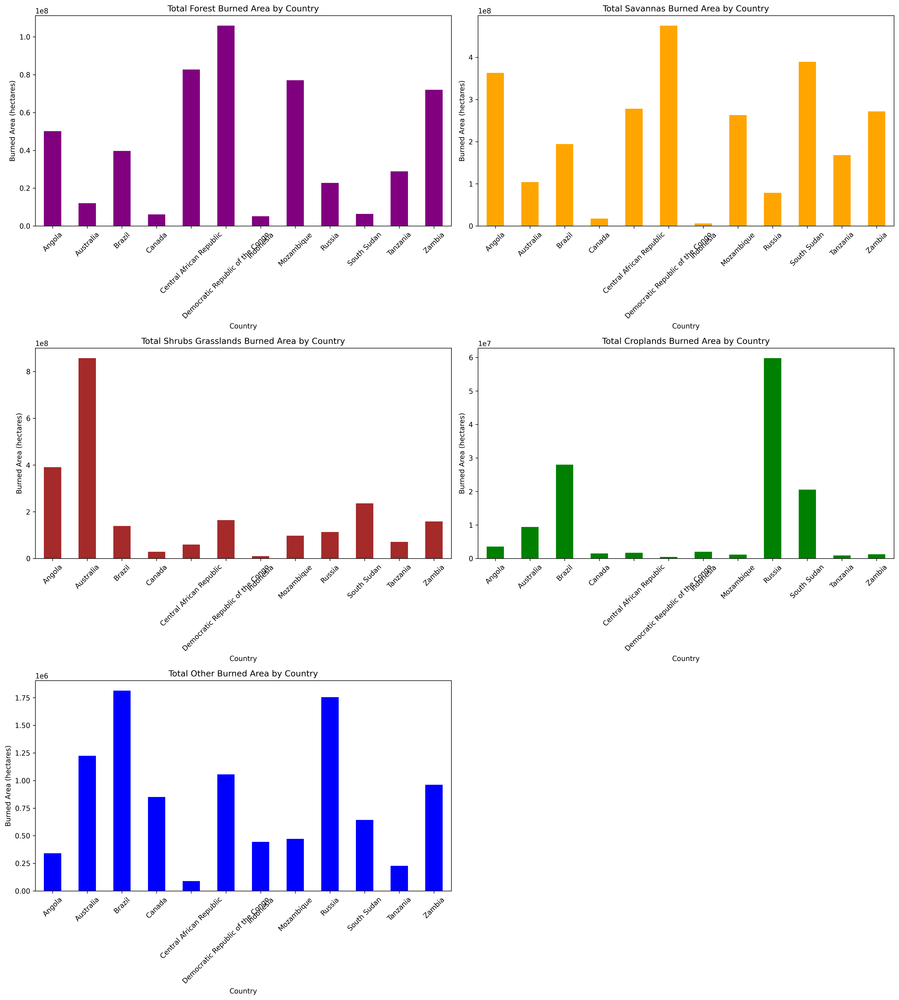

In [182]:
# List of land types
land_types = ['Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA', 'Croplands_BA', 'Other_BA']
colors = ['purple', 'orange', 'brown', 'green', 'blue']

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 20), dpi=300)
axes = axes.flatten()

# Plotting the bar chart for each land type
for i, (land_type, color) in enumerate(zip(land_types, colors)):
    total_burned_by_country = merged10_df.groupby('Country_Name')[land_type].sum()
    total_burned_by_country.plot(kind='bar', color=color, ax=axes[i])
    axes[i].set_title(f'Total {land_type.replace("_BA", "").replace("_", " ")} Burned Area by Country')
    axes[i].set_xlabel('Country')
    axes[i].set_ylabel('Burned Area (hectares)')
    axes[i].tick_params(axis='x', rotation=45)
fig.delaxes(axes[5])
plt.tight_layout()
plt.show()

#### Insights

* **Regional Patterns:** African countries such as the Democratic Republic of the Congo, Angola, and Mozambique show high burned areas across multiple land cover types, highlighting the prevalence of wildfires in these regions.

* **High Fire-Prone Countries:** Countries like Australia and Brazil consistently show high burned areas across different land cover types, indicating frequent fire occurrences.

* **Agricultural Practices:** High burned areas in croplands in countries like Russia and Mozambique suggest that agricultural practices significantly contribute to burned areas.

* **Fire Management:** The varying burned areas by country and land cover type emphasize the need for tailored fire management and prevention strategies that consider the specific environmental and socio-economic factors of each region.

**5. Total Burned Area by different Land Types**

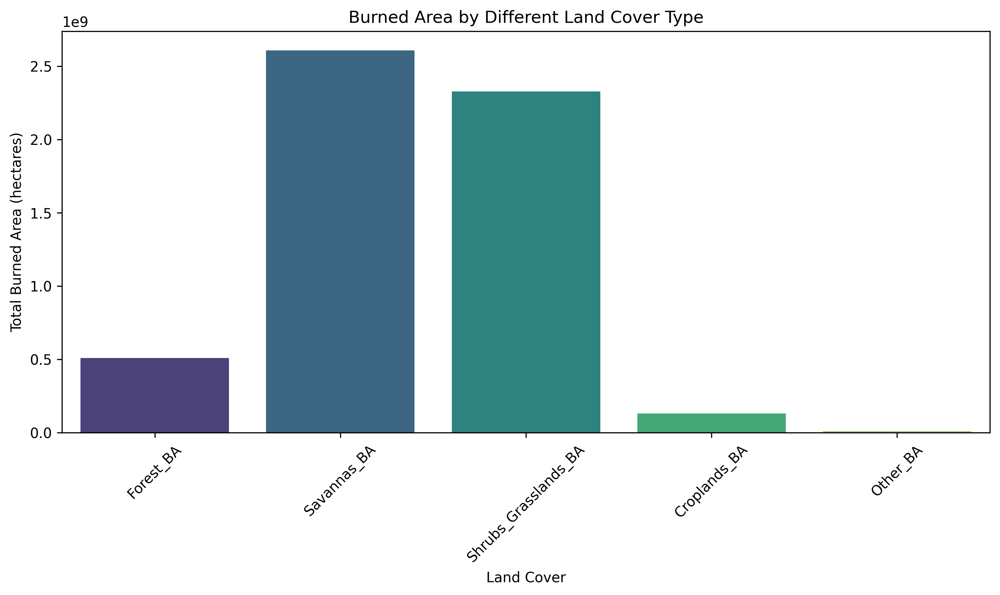

In [77]:
# Calculate the total burned area for each land cover type
land_cover_burned_area = merged10_df[['Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA', 'Croplands_BA', 'Other_BA']].sum()

# Plot the bar chart
plt.figure(figsize=(10, 6),dpi=300)
sns.barplot(x=land_cover_burned_area.index, y=land_cover_burned_area .values, palette='viridis')
plt.xlabel('Land Cover')
plt.ylabel('Total Burned Area (hectares)')
plt.title('Burned Area by Different Land Cover Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Insights

* **High Fire in Savannas and Shrubs Grasslands:**
The extremely high total burned areas in savannas and shrubs grasslands suggest these ecosystems are highly fire-prone. Fire management and prevention efforts should prioritize these regions to mitigate extensive fire damage.

* **Moderate Forest Fires:**
While forests have a significant total burned area, it is much lower than open landscapes like savannas and grasslands. This might be due to different fire dynamics or more effective forest fire management practices.

* **Agricultural Fire Management:**
The relatively low total burned area in croplands suggests that agricultural practices and fire management strategies are effective in minimizing fire occurrences in these areas.

* **Low Fire Incidence in Miscellaneous Land Types:**
The negligible burned area in the "Other" category indicates that these land types are less prone to fires, which could include urban areas, wetlands, and other regions with less fire-adapted vegetation.



*Step6: WildFire Emissions DataAnalysis*

**1. Different Emission Gases over Years**

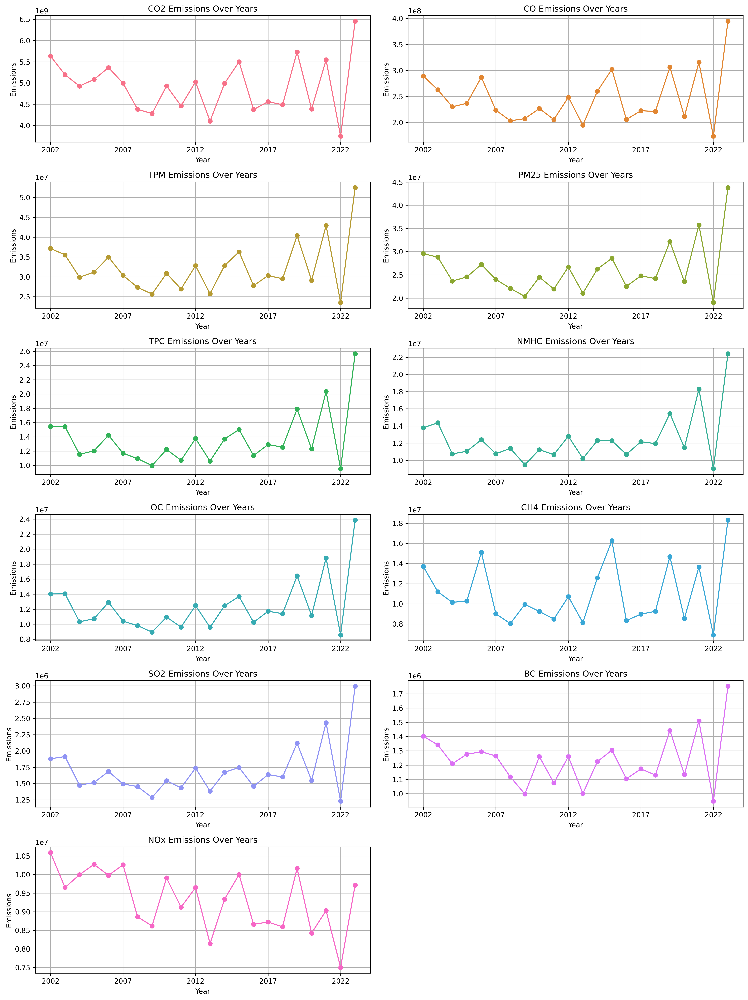

In [183]:
# Group data by year and calculate the total emissions for each variable
emissions_yearly = merged10_df.groupby('Year')[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum()

# List of emission variables
emission_variables = ['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']

# Define a color palette for the line plots
colors = sns.color_palette('husl', n_colors=len(emission_variables))

# Create a figure with subplots
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(15, 20), dpi=300)
axes = axes.flatten()

# Loop through each emission variable and plot
for i, var in enumerate(emission_variables):
    emissions_yearly[var].plot(ax=axes[i], kind='line', marker='o', color=colors[i])
    axes[i].set_title(f'{var} Emissions Over Years')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Emissions')
    axes[i].grid(True)

# Remove any unused subplots
for j in range(len(emission_variables), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

#### Insights 

* **2022 Emission Spikes:** Most emission types show a significant increase in 2022, likely due to a surge in wildfire activity during this year. This spike suggests that increased wildfires may be a common underlying factor affecting emission levels.

* **Long-Term Trends:** While some emissions like CO and CO2 display consistent long-term trends, others such as CH4 and NOx show more variability. This variability can be attributed to fluctuations in wildfire intensity and frequency, as well as changes in vegetation types and fire management practices.

* **Air Quality and Health:** The notable rise in pollutants like PM2.5, SO2, and NOx in 2022 underscores potential air quality and health concerns associated with wildfire emissions. This increase highlights the urgent need for enhanced wildfire management strategies and monitoring to mitigate adverse effects on air quality and public health.


**2. Different Emission Gases over Quater**

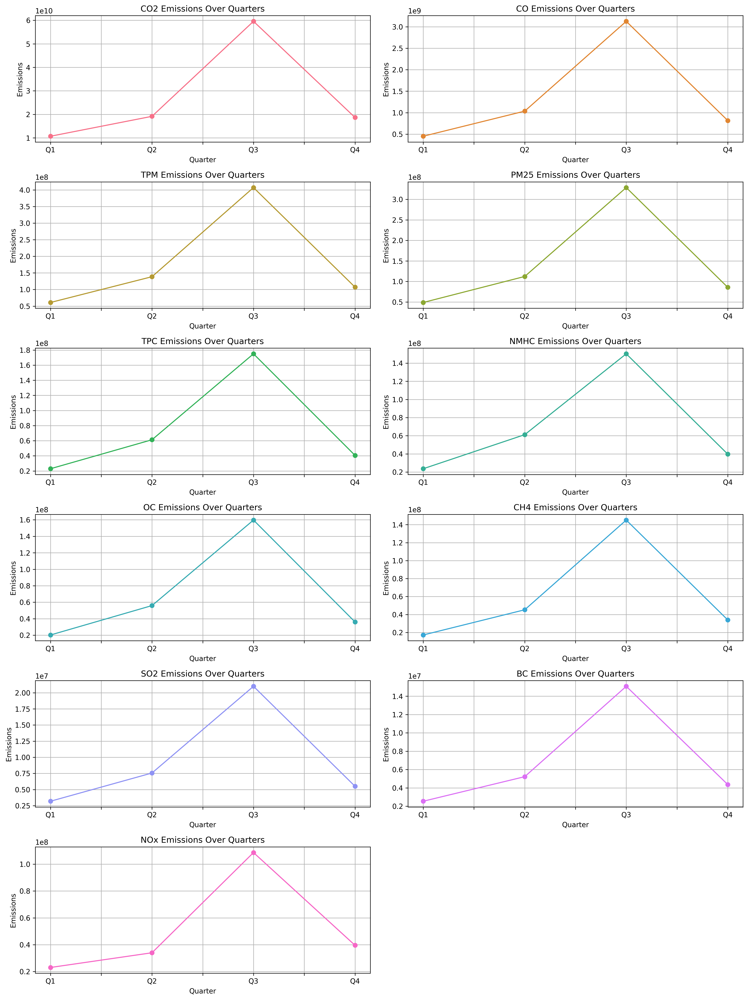

In [184]:
# Group data by year and calculate the total emissions for each variable
emissions_quarterly = merged10_df.groupby('Quarter')[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum()

# List of emission variables
emission_variables = ['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']

# Define a color palette for the line plots
colors = sns.color_palette('husl', n_colors=len(emission_variables))

# Create a figure with subplots
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(15, 20), dpi=300)
axes = axes.flatten()

# Loop through each emission variable and plot
for i, var in enumerate(emission_variables):
    emissions_quarterly[var].plot(ax=axes[i], kind='line', marker='o', color=colors[i])
    axes[i].set_title(f'{var} Emissions Over Quarters')
    axes[i].set_xlabel('Quarter')
    axes[i].set_ylabel('Emissions')
    axes[i].grid(True)
for j in range(len(emission_variables), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

#### Insights

* **Quarterly Peaks:** Emissions typically peak in Q3, indicating a period of elevated pollutant levels across various emission types. This seasonal spike is likely linked to increased wildfire activity during this quarter, driven by factors such as higher temperatures, dry conditions, and more frequent fire incidents.

* **Emission Management:** The recurring peak in Q3 highlights the importance of implementing targeted emission reduction strategies and fire management practices during this period to address the seasonal surge in emissions and its impacts on air quality.

* **Health and Environment:** The rise in pollutants like PM2.5, SO2, and NOx in Q3, primarily due to intensified wildfire activity, emphasizes the need for enhanced air quality monitoring and public health advisories. This is crucial to manage the adverse effects of smog and acid rain on health and the environment during this high-emission period.

**3. Different Emission Gases over Month**

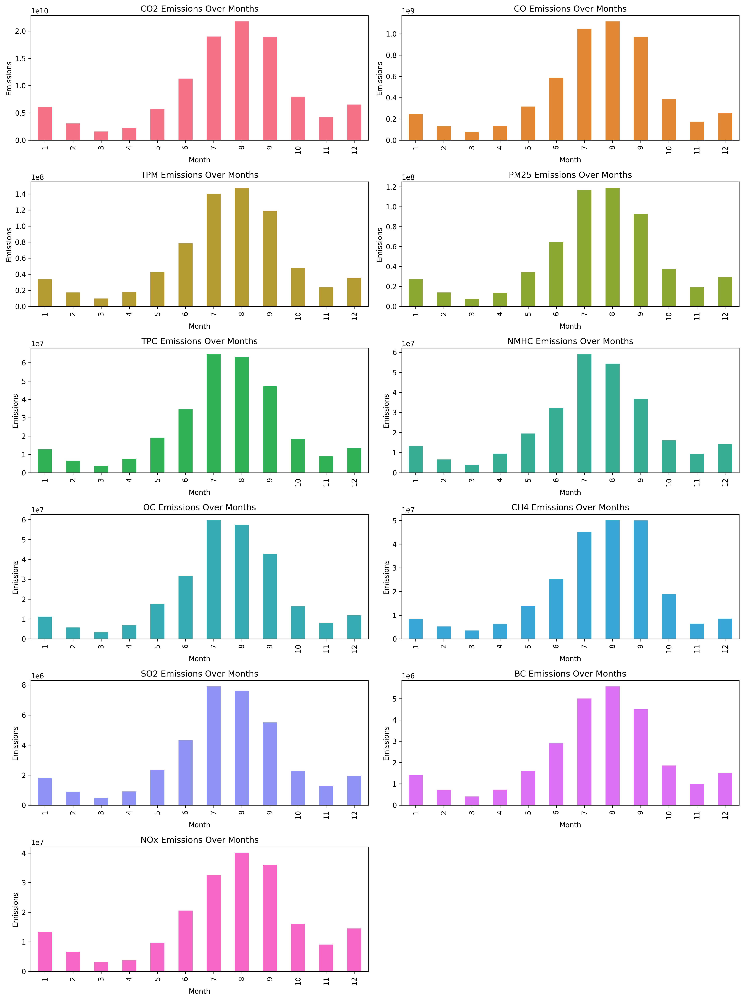

In [186]:
# Group data by month and calculate the total emissions for each variable
emissions_monthly = merged10_df.groupby('Month')[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum()

# List of emission variables
emission_variables = ['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']

# Define a color palette for the bar plots
colors = sns.color_palette('husl', n_colors=len(emission_variables))

# Create a figure with subplots
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(15, 20), dpi=300)
axes = axes.flatten()

# Loop through each emission variable and plot
for i, var in enumerate(emission_variables):
    emissions_monthly[var].plot(ax=axes[i], kind='bar', color=colors[i])
    axes[i].set_title(f'{var} Emissions Over Months')
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Emissions')
for j in range(len(emission_variables), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

#### Insights

* **Seasonal Peaks:** Emissions are usually highest in the summer months (July and August). This increase might be due to more wildfires caused by dry and hot conditions, and higher use of air conditioning, which leads to more pollution from power plants.

* **Air Quality Management:** The regular increase in summer shows that we need to focus on controlling air pollution during these months. This could mean using cleaner energy sources, managing land to prevent fires, and enforcing rules to cut down on emissions.

* **Health and Environment:** The higher levels of pollutants like PM2.5, SO2, and NOx in the summer show that we need to keep a closer watch on air quality and provide health warnings. This is important to help prevent health problems caused by poor air quality and to protect the environment.

**4. Total Emission Gases over Country**

In [187]:
# Group data by country and calculate the total emissions for each variable
emissions_by_country = merged10_df.groupby('Country_Name')[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum()

# List of emission variables
emission_variables = ['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']

# Define a color palette for the line plots
colors = sns.color_palette('husl', n_colors=len(emission_variables))

# Create a figure with subplots
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(18, 38), dpi=300)
axes = axes.flatten()

# Loop through each emission variable and plot
for i, var in enumerate(emission_variables):
    emissions_by_country[var].plot(ax=axes[i], kind='bar', color=colors[i])
    axes[i].set_title(f'Total {var} Emissions by Country')
    axes[i].set_xlabel('Country')
    axes[i].set_ylabel('Emissions')
    axes[i].tick_params(axis='x', rotation=90)
for j in range(len(emission_variables), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

#### Insights 

* **High Emission Countries:** Russia, the Democratic Republic of the Congo, and Brazil consistently have high emissions. This is likely due to a lot of wildfires in these areas, along with industrial activities and burning of biomass.

* **Moderate Emission Countries:** Countries like Indonesia, Mozambique, and Australia also have significant emissions. This suggests they experience a fair amount of wildfires and other similar sources of pollution.

* **Low Emission Countries:** Zambia, Tanzania, and Canada have lower emissions. This could be because they have fewer wildfires or better systems in place to manage and control pollution.

* **Pollution Management:** These observations show that high-emission countries need better strategies to manage pollution from wildfires to protect the environment and health.


**5. Total Emissions by different Emission Gases**

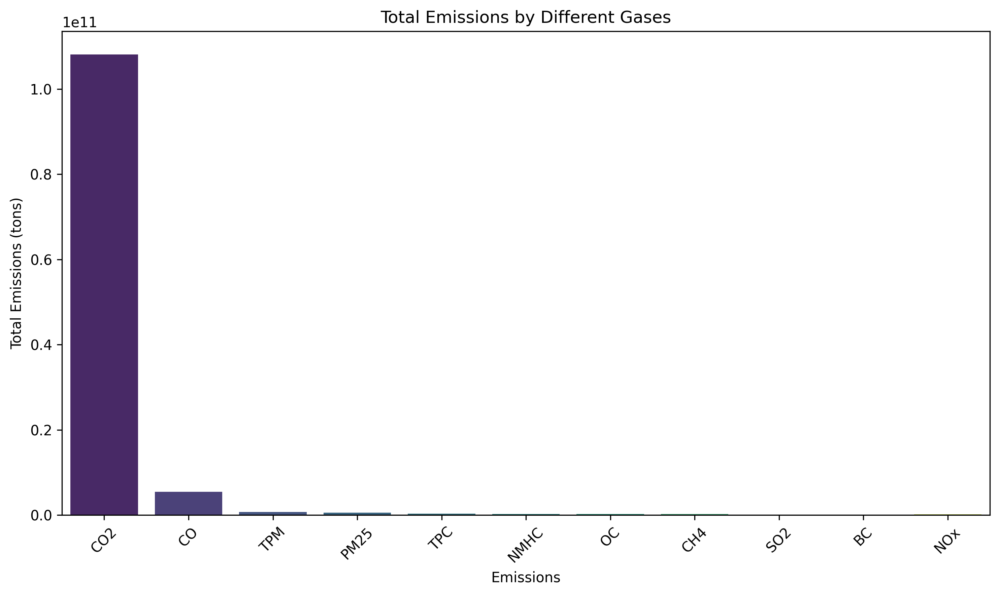

In [188]:
# Land cover analysis for emissions (e.g., CO2)
land_cover_emissions = merged10_df[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum()

# Plot the bar chart
plt.figure(figsize=(10, 6),dpi=300)
sns.barplot(x=land_cover_emissions.index, y=land_cover_emissions .values, palette='viridis')
plt.xlabel('Emissions')
plt.ylabel('Total Emissions (tons)')
plt.title('Total Emissions by Different Gases')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### Insights

* **CO2 Dominance:** The chart shows that CO2 is the most common emission from wildfires. This means we need to focus on reducing CO2 emissions from fires to better address climate change. We can do this by preventing large wildfires and managing forests more carefully.

* **Health and Environmental Impact:** Even though gases like PM2.5, CH4, and NOx are less common, they still have a serious impact on health and the environment. It’s important to control these emissions from wildfires to protect people and nature.

* **Holistic Emission Reduction:** To deal with the effects of wildfires on climate and air quality, we need to address all emissions, not just CO2. This involves managing wildfire risks, improving fire prevention, and restoring burned areas.

* **Data Interpretation:** The large difference between CO2 and other emissions from wildfires shows that we need to understand both the amount and the effects of different pollutants. Effective wildfire management should consider all emissions, not just the most abundant ones.

 *Step7: Results*

**1. What are the long-term trends in wildfire burned areas and emissions globally, and are there significant changes over time?**

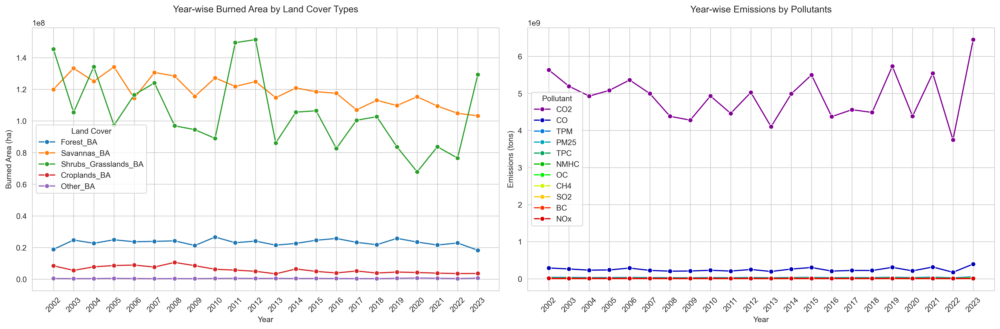

In [259]:
# Group by Year and sum the burned area for each land cover type
yearly_burned_area = merged10_df.groupby('Year')[['Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA', 'Croplands_BA', 'Other_BA']].sum().reset_index()

# Melt the DataFrame for Seaborn plotting
yearly_burned_area_melted = yearly_burned_area.melt(id_vars='Year', var_name='Land Cover Type', value_name='Burned Area')

# Group by Year and sum the emissions for each pollutant
yearly_emissions = merged10_df.groupby('Year')[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum().reset_index()

# Melt the DataFrame for Seaborn plotting
yearly_emissions_melted = yearly_emissions.melt(id_vars='Year', var_name='Pollutant', value_name='Emissions')

# Plotting year-wise emissions for different pollutants
plt.figure(figsize=(18, 6),dpi=300)

# Plot for Burned Area
plt.subplot(1, 2, 1)
sns.lineplot(data=yearly_burned_area_melted, x='Year', y='Burned Area', hue='Land Cover Type', marker='o',palette='tab10')
plt.title('Year-wise Burned Area by Land Cover Types',pad= 20)
plt.xlabel('Year')
plt.ylabel('Burned Area (ha)')
plt.grid(True)
plt.legend(title='Land Cover')
plt.xticks(rotation=45)

# Plot for Emissions
plt.subplot(1, 2, 2)
sns.lineplot(data=yearly_emissions_melted, x='Year', y='Emissions', hue='Pollutant', marker='o',palette='nipy_spectral')
plt.title('Year-wise Emissions by Pollutants',pad= 20)
plt.xlabel('Year')
plt.ylabel('Emissions (tons)')
plt.grid(True)
plt.legend(title='Pollutant')
plt.tight_layout()
plt.xticks(rotation=45)
plt.savefig('Op1.png')
plt.show()

### Insights 
* **Consistency and Variability:** The burned areas for most land cover types show stability with minor fluctuations, indicating consistent fire management practices. However, shrubs and grasslands show more variability, suggesting they are more influenced by external factors.

* **CO2 Dominance:** CO2 remains the dominant pollutant, with significant fluctuations over the years. This emphasizes the importance of focusing on CO2 reduction strategies to combat climate change effectively.

* **Emission Control:** The relatively low levels of other pollutants indicate that current emission control measures might be effective, but continuous monitoring and regulation are necessary to maintain and improve air quality.

* **Policy Implications:** The insights from these charts can guide policymakers in developing targeted fire management and emission reduction strategies, particularly focusing on the areas and periods with the highest variability and emissions

**2. How do seasonal variations affect wildfire activities and emissions, and are there specific months or quarters with higher prevalence or levels?**

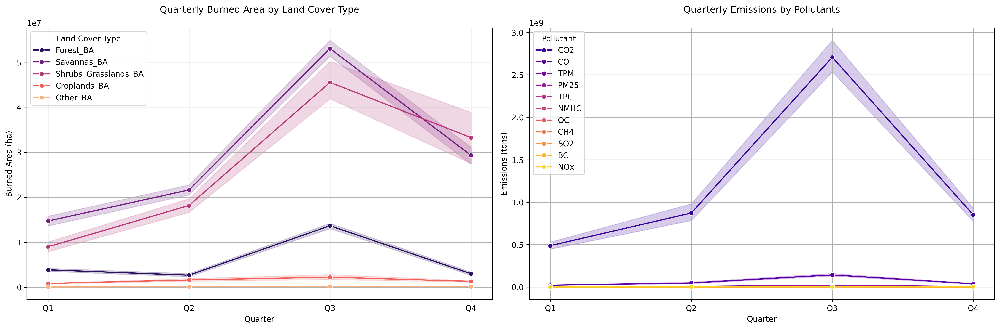

In [246]:
# Group by Year, Quarter, and Land Cover Type and sum the burned area for each type
quarterly_burned_area = merged10_df.groupby(['Year', 'Quarter'])[['Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA', 'Croplands_BA', 'Other_BA']].sum().reset_index()

# Melt the DataFrame for Seaborn plotting
quarterly_burned_area_melted = quarterly_burned_area.melt(id_vars=['Year', 'Quarter'], var_name='Land Cover Type', value_name='Burned Area')

# Group by Year, Quarter, and Pollutant and sum the emissions for each pollutant
quarterly_emissions = merged10_df.groupby(['Year', 'Quarter'])[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum().reset_index()

# Melt the DataFrame for Seaborn plotting
quarterly_emissions_melted = quarterly_emissions.melt(id_vars=['Year', 'Quarter'], var_name='Pollutant', value_name='Emissions')

# Plotting quarterly burned area and emissions data side by side
plt.figure(figsize=(18, 6),dpi=300)

# Plot for Quarterly Burned Area
plt.subplot(1, 2, 1)
sns.lineplot(data=quarterly_burned_area_melted, x='Quarter', y='Burned Area', hue='Land Cover Type', marker='o', palette='magma')
plt.title('Quarterly Burned Area by Land Cover Type',pad=20)
plt.xlabel('Quarter')
plt.ylabel('Burned Area (ha)')
plt.grid(True)
plt.legend(title='Land Cover Type')

# Plot for Quarterly Emissions by Pollutants
plt.subplot(1, 2, 2)
sns.lineplot(data=quarterly_emissions_melted, x='Quarter', y='Emissions', hue='Pollutant', marker='o', palette='plasma')
plt.title('Quarterly Emissions by Pollutants',pad=20)
plt.xlabel('Quarter')
plt.ylabel('Emissions (tons)')
plt.grid(True)
plt.legend(title='Pollutant')
plt.tight_layout()
plt.savefig('Op2.png')
plt.show()


### Insights

* **Summer Peak:** Both burned areas and emissions peak in Q3, indicating that the summer months are the most critical period for fire management and emission control.

* **Seasonal Vulnerability:** The significant increase in burned areas and emissions during Q3 highlights the need for intensified monitoring and mitigation efforts during this period.

* **Targeted Strategies:** Policies and strategies should focus on reducing emissions and managing fires effectively during the summer months to mitigate the environmental and health impacts.

* **Holistic Approach:** Addressing the summer peak in both burned areas and emissions requires a comprehensive approach, including better land management, stricter emission controls, and public awareness campaigns.

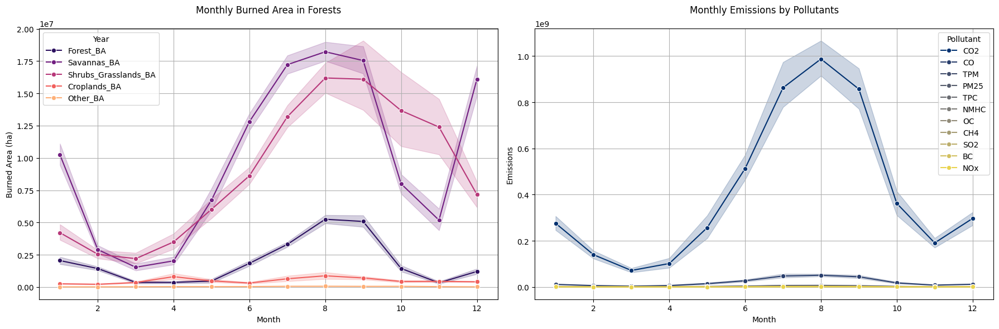

In [247]:
# Group by Month and sum the burned area for each land cover type
monthly_burned_area = merged10_df.groupby(['Year', 'Month'])[['Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA', 'Croplands_BA', 'Other_BA']].sum().reset_index()

# Melt the DataFrame for Seaborn plotting
monthly_burned_area_melted = monthly_burned_area.melt(id_vars=['Year', 'Month'], var_name='Land Cover Type', value_name='Burned Area')

# Group by Month and sum the emissions for each pollutant
monthly_emissions = merged10_df.groupby(['Year', 'Month'])[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum().reset_index()

# Melt the DataFrame for Seaborn plotting
monthly_emissions_melted = monthly_emissions.melt(id_vars=['Year', 'Month'], var_name='Pollutant', value_name='Emissions')

# Plotting monthly burned area for forests and emissions data side by side
plt.figure(figsize=(18, 6))

# Plot for Monthly Burned Area in Forests
plt.subplot(1, 2, 1)
sns.lineplot(data=monthly_burned_area_melted, x='Month', y='Burned Area', hue='Land Cover Type', marker='o', palette='magma')
plt.title('Monthly Burned Area in Forests',pad=20)
plt.xlabel('Month')
plt.ylabel('Burned Area (ha)')
plt.grid(True)
plt.legend(title='Year')

# Plot for Monthly Emissions by Pollutants
plt.subplot(1, 2, 2)
sns.lineplot(data=monthly_emissions_melted, x='Month', y='Emissions', hue='Pollutant', marker='o', palette='cividis')
plt.title('Monthly Emissions by Pollutants',pad=20)
plt.xlabel('Month')
plt.ylabel('Emissions')
plt.grid(True)
plt.legend(title='Pollutant')
plt.tight_layout()
plt.show()

### Insights

* **Summer Peak:** Both the areas burned by wildfires and the emissions from these fires are highest in the summer months (July and August). This shows that summer is the most important time for managing fires and controlling emissions.

* **Seasonal Vulnerability:** The big increase in burned areas and emissions during summer means we need to pay extra attention and work harder to monitor and reduce fires during this time.

**3. Which countries or regions experience the most wildfires, and what factors contribute to their prevalence?**

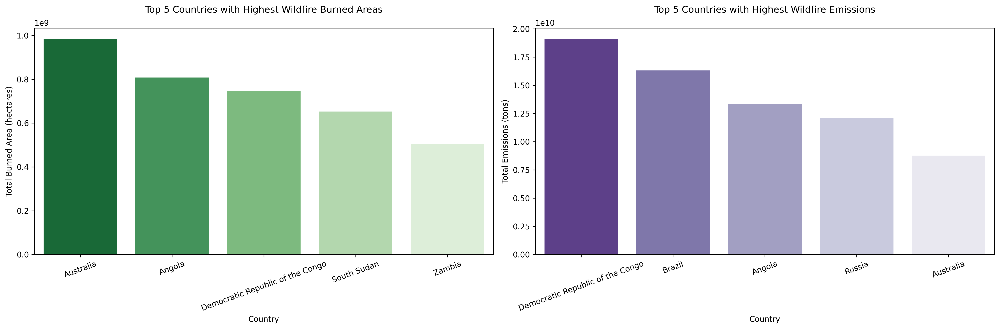

In [256]:
country_burned_area = merged10_df.groupby('Country_Name')[['Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA', 'Croplands_BA', 'Other_BA']].sum()
sorted_country = country_burned_area.sum(axis=1).sort_values(ascending=False)
top_5_country = sorted_country.head(5)
country_emissions = merged10_df.groupby('Country_Name')[['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].sum()
sorted_countrys = country_emissions.sum(axis=1).sort_values(ascending=False)
top_5_countrys = sorted_countrys.head(5)

# Plotting side by side
plt.figure(figsize=(18, 6),dpi=300)
# Dark to light color palette for burned areas
palette_burned = sns.color_palette("Greens", len(top_5_country))
# Sort the palette to ensure the highest value has the darkest color
palette_burned.reverse()

# Plot the top 5 countries with the highest burned areas
plt.subplot(1, 2, 1)
sns.barplot(x=top_5_country.index, y=top_5_country.values, palette=palette_burned)
plt.title('Top 5 Countries with Highest Wildfire Burned Areas',pad=20)
plt.xlabel('Country')
plt.ylabel('Total Burned Area (hectares)')
plt.xticks(rotation=20)

# Plot the top 5 countries with the highest emissions
palette_emissions = sns.color_palette("Purples", len(top_5_countrys))
# Sort the palette to ensure the highest value has the darkest color
palette_emissions.reverse()
plt.subplot(1, 2, 2)
sns.barplot(x=top_5_countrys.index, y=top_5_countrys.values, palette=palette_emissions)
plt.title('Top 5 Countries with Highest Wildfire Emissions',pad=20)
plt.xlabel('Country')
plt.ylabel('Total Emissions (tons)')
plt.xticks(rotation=20)
plt.tight_layout()
plt.savefig('Op3.png')
plt.show()

### Insights 

* **Correlation Between Burned Areas and Emissions:** Countries with large burned areas often have high emissions, indicating that extensive wildfires contribute significantly to global pollutant levels.

* **Regional Fire Dynamics:**
    - Australia: High burned areas and emissions due to frequent and severe wildfires.
    - Angola and Zambia: High burned areas and emissions driven by savanna fires.
    - Democratic Republic of the Congo: Significant emissions from deforestation and agricultural burning.
    - Brazil: High emissions from Amazon rainforest fires.
    - Russia: Significant emissions from forest fires in Siberia and other regions.

* **Global Impact:** The high emissions from these countries highlight the global impact of wildfires, contributing to climate change and affecting air quality across continents.

* **Fire Management and Policy:** The data underscores the need for effective wildfire management strategies in these high-risk countries to reduce burned areas and emissions, mitigating the environmental and health impacts.

**4. Is there a correlation between wildfire area burned and emission gases?**

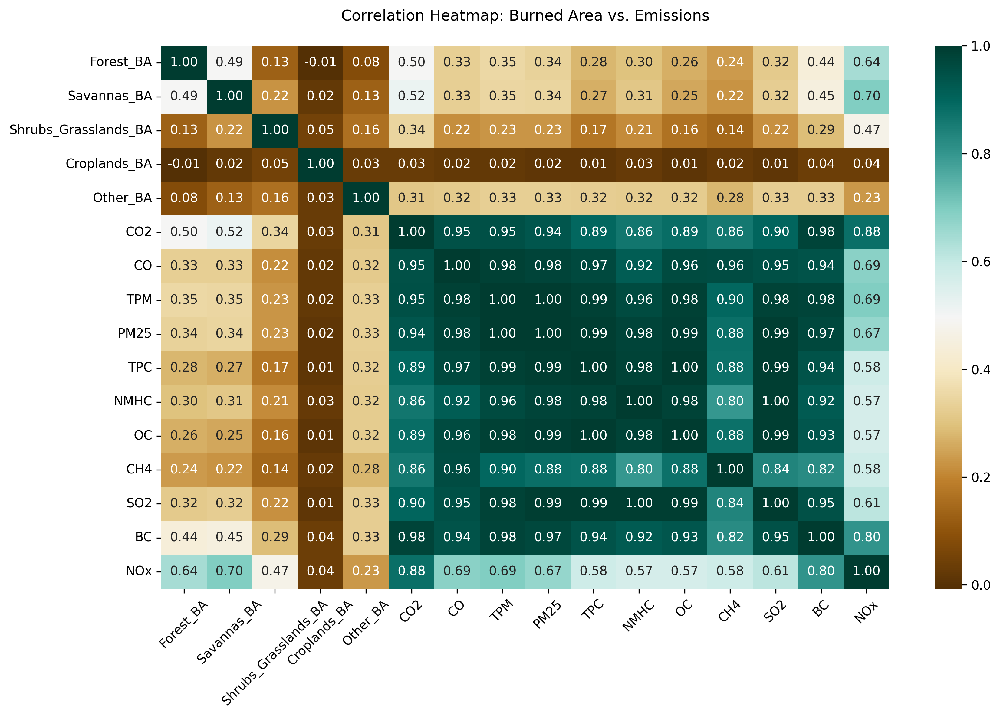

In [219]:
# Calculate correlation coefficients between land cover types and emissions
burnedarea_emissions_correlation = merged10_df[['Forest_BA', 'Savannas_BA', 'Shrubs_Grasslands_BA', 'Croplands_BA', 'Other_BA',
                                             'CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx']].corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 8),dpi=300)
sns.heatmap(burnedarea_emissions_correlation, annot=True, cmap='BrBG', fmt=".2f")
plt.title('Correlation Heatmap: Burned Area vs. Emissions',pad= 20)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('Op4.png', dpi=300)
plt.show()

### Insights 

1. **High Emission Correlations**:
    - Emissions like CO2, CO, TPM, PM2.5, TPC, NMHC, OC, CH4, SO2, and BC are highly correlated, indicating they often occur together and likely share common sources.

2. **Burned Areas and Emission Sources**:
    - **Forests** and **Savannas**: Moderate to strong contributors to emissions, especially CO2, CO, TPM, and NOx.
    - **Shrubs and Grasslands**: Lesser but still notable contributors to emissions.
    - **Croplands**: Minimal impact on emissions, with weak or negligible correlations.
    - **Other Areas**: Moderate contributors to CO2 and CO emissions.

3. **NOx Emissions**:
    - Strongly linked to forest and savanna burning.
    - Often emitted with CO2, CO, and TPM, suggesting similar source processes.

4. **Implications for Emission Reduction**:
    - **Interdependencies**: Reducing one type of emission could help decrease others due to their strong correlations.
    - **Targeted Strategies**: Focusing on forest and savanna burning could significantly reduce multiple emissions, including NOx.